In [ ]:
!pip install tensorflow-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 588.3 MB 21 kB/s 
     |████████████████████████████████| 439 kB 60.6 MB/s 
     |████████████████████████████████| 6.0 MB 57.3 MB/s 
     |████████████████████████████████| 1.7 MB 50.5 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully u

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
print(tf.version)

<module 'tensorflow._api.v2.version' from '/usr/local/lib/python3.8/dist-packages/tensorflow/_api/v2/version/__init__.py'>


In [ ]:
!nvidia-smi

Fri Dec 23 11:23:14 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P0    28W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input,Lambda,Dense,Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob
import keras
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt



In [ ]:
#resize all the image to this
IMAGE_SIZE=[224,224]
train_path = '/content/drive/MyDrive/Data/cotton disease/data/train'
validation_path = '/content/drive/MyDrive/Data/cotton disease/data/val'


In [ ]:
# this is the augmentation configuration we will use for training
# It generate more images using below parameters
training_datagen = ImageDataGenerator(rescale=1./255,
                                      rotation_range=40,
                                      width_shift_range=0.2,
                                      height_shift_range=0.2,
                                      shear_range=0.2,
                                      zoom_range=0.2,
                                      horizontal_flip=True,
                                      fill_mode='nearest')

# this is a generator that will read pictures found in
# at train_data_path, and indefinitely generate
# batches of augmented image data
training_data = training_datagen.flow_from_directory(train_path, # this is the target directory
                                      target_size=(150, 150), # all images will be resized to 150x150
                                      batch_size=32,
                                      class_mode='binary')  # since we use binary_crossentropy loss, we need binary labels
 

Found 1981 images belonging to 4 classes.


In [ ]:
training_data.class_indices

{'diseased cotton leaf': 0,
 'diseased cotton plant': 1,
 'fresh cotton leaf': 2,
 'fresh cotton plant': 3}

In [ ]:
# this is the augmentation configuration we will use for validation:
# only rescaling
valid_datagen = ImageDataGenerator(rescale=1./255)
 
# this is a similar generator, for validation data
valid_data = valid_datagen.flow_from_directory(validation_path,
                                  target_size=(150,150),
                                  batch_size=32,
                                  class_mode='binary')

Found 324 images belonging to 4 classes.


TypeError: ignored

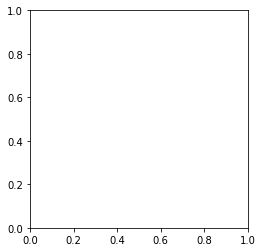

In [ ]:
images = [training_data[0][0][0] for i in range(5)]
plt.imshow(images)

In [ ]:
model_path = '/content/drive/My Drive/My ML Project /DL Project/CNN/cotton plant disease prediction/v3_red_cott_dis.h5'
checkpoint = ModelCheckpoint(model_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

In [ ]:
#Building cnn model
cnn_model = keras.models.Sequential([
                                    keras.layers.Conv2D(filters=32, kernel_size=3, input_shape=[150, 150, 3]),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),
                                    keras.layers.Conv2D(filters=64, kernel_size=3),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),
                                    keras.layers.Conv2D(filters=128, kernel_size=3),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),                                    
                                    keras.layers.Conv2D(filters=256, kernel_size=3),
                                    keras.layers.MaxPooling2D(pool_size=(2,2)),
 
                                    keras.layers.Dropout(0.5),                                                                        
                                    keras.layers.Flatten(), # neural network beulding
                                    keras.layers.Dense(units=128, activation='relu'), # input layers
                                    keras.layers.Dropout(0.1),                                    
                                    keras.layers.Dense(units=256, activation='relu'),                                    
                                    keras.layers.Dropout(0.25),                                    
                                    keras.layers.Dense(units=4, activation='softmax') # output layer
])

In [ ]:
# compile cnn model
cnn_model.compile(optimizer = Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
 
# train cnn model
#given epochs = 500
history = cnn_model.fit(training_data, 
                          epochs=50, 
                          verbose=1, 
                          validation_data= valid_data,
                          callbacks=callbacks_list) # time start 16.06

Epoch 1/50
62/62 [==============================] - ETA: 0s - loss: 1.2581 - accuracy: 0.4245 
Epoch 1: val_accuracy improved from -inf to 0.46914, saving model to /content/drive/My Drive/My ML Project /DL Project/CNN/cotton plant disease prediction/v3_red_cott_dis.h5
62/62 [==============================] - 1109s 18s/step - loss: 1.2581 - accuracy: 0.4245 - val_loss: 1.0990 - val_accuracy: 0.4691
Epoch 2/50
62/62 [==============================] - ETA: 0s - loss: 1.0704 - accuracy: 0.5371
Epoch 2: val_accuracy improved from 0.46914 to 0.62963, saving model to /content/drive/My Drive/My ML Project /DL Project/CNN/cotton plant disease prediction/v3_red_cott_dis.h5
62/62 [==============================] - 31s 503ms/step - loss: 1.0704 - accuracy: 0.5371 - val_loss: 0.9040 - val_accuracy: 0.6296
Epoch 3/50
62/62 [==============================] - ETA: 0s - loss: 0.9771 - accuracy: 0.5881
Epoch 3: val_accuracy did not improve from 0.62963
62/62 [==============================] - 29s 467ms/

In [ ]:
cnn_model.summary()

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()



In [ ]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
history.history

path of image/content/dis_leaf (322).jpg


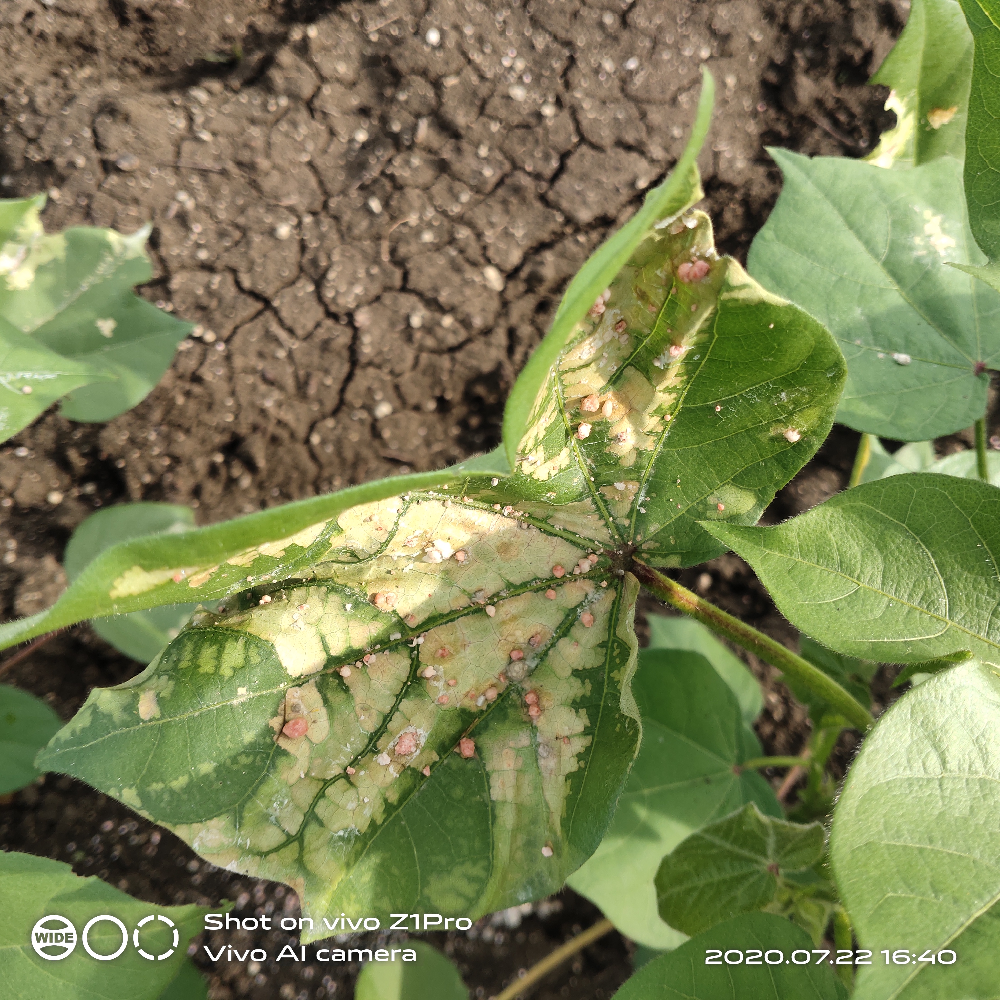

NameError: ignored

In [ ]:
# Predictive System
import cv2
from google.colab.patches import cv2_imshow
input_image_path = input('path of image')
input_image = cv2.imread(input_image_path)
cv2_imshow(input_image)
#grayscale = cv2.cvtColor(input_image,cv2.COLOR_RGB2GRAY)
#image_reshape = np.reshape(input_image_resize,[1,28,28])
input_prediction = model.predict(input_image) #(image_reshape)
input_pred_label = np.argmax(input_prediction)
print('the HAndwritten is classified as',input_pred_label)

# **Using Transfer Learning**

In [ ]:
#import the inception V3 library , and add preprocessing layer to  the front of VGG
#Here we will be using imagenet weights
inception = InceptionV3(input_shape=IMAGE_SIZE + [3],weights='imagenet',include_top=False)

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
for layer in inception.layers:
  layer.trainable = False 

In [ ]:
#to see how many no of classes do i have 
folders = glob('/content/drive/MyDrive/Data/cotton disease/data/train/*')

In [ ]:
folders

['/content/drive/MyDrive/Data/cotton disease/data/train/fresh cotton leaf',
 '/content/drive/MyDrive/Data/cotton disease/data/train/fresh cotton plant',
 '/content/drive/MyDrive/Data/cotton disease/data/train/diseased cotton leaf',
 '/content/drive/MyDrive/Data/cotton disease/data/train/diseased cotton plant']

In [ ]:
#our layers - you can add more if you want
x= Flatten()(inception.output)

In [ ]:
prediction = Dense(len(folders),activation='softmax')(x)
#creation of model object
model=Model(inputs=inception.input,outputs=prediction)


In [ ]:
#view the structure of the model
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d_4[0][0]']               
 alization)                     )                                                             

In [ ]:
#tell the model what cost and optimization methode to you
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy'])

In [ ]:
#use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen=ImageDataGenerator(rescale=1./255,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)


In [ ]:
#make sure you provide the same target size as the initialised for the image size
training_set = train_datagen.flow_from_directory('/content/drive/MyDrive/Data/cotton disease/data/train',
                                                 target_size = (224,224),
                                                 batch_size=16,
                                                 class_mode='categorical') 

Found 1981 images belonging to 4 classes.


In [ ]:
test_set= test_datagen.flow_from_directory('/content/drive/MyDrive/Data/cotton disease/data/val',
                                           target_size = (224,224),
                                           batch_size=16,
                                           class_mode='categorical')

Found 324 images belonging to 4 classes.


In [ ]:
#fit the model
#run the cell it will take some time to execute
r=model.fit_generator(
    training_set,
    validation_data=test_set,
    epochs=10,
    steps_per_epoch=len(training_set),
    validation_steps=len(test_set)
    )

<ipython-input-37-77ca5c703ce1>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  r=model.fit_generator(


Epoch 1/10
124/124 [==============================] - 49s 348ms/step - loss: 2.1301 - accuracy: 0.7809 - val_loss: 1.2264 - val_accuracy: 0.8333
Epoch 2/10
124/124 [==============================] - 40s 322ms/step - loss: 1.0805 - accuracy: 0.8693 - val_loss: 0.6528 - val_accuracy: 0.9043
Epoch 3/10
124/124 [==============================] - 40s 322ms/step - loss: 0.9575 - accuracy: 0.9026 - val_loss: 1.3636 - val_accuracy: 0.8827
Epoch 4/10
124/124 [==============================] - 42s 339ms/step - loss: 1.2441 - accuracy: 0.8910 - val_loss: 1.1001 - val_accuracy: 0.9167
Epoch 5/10
124/124 [==============================] - 39s 313ms/step - loss: 0.9810 - accuracy: 0.9182 - val_loss: 1.0426 - val_accuracy: 0.9352
Epoch 6/10
124/124 [==============================] - 40s 322ms/step - loss: 0.9542 - accuracy: 0.9268 - val_loss: 1.1070 - val_accuracy: 0.9475
Epoch 7/10
124/124 [==============================] - 40s 326ms/step - loss: 0.8482 - accuracy: 0.9349 - val_loss: 1.6062 - val_ac